## UMAP-PCA analysis of excitatory and inhibitory sub-manifolds

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pylab as plt
import colorcet as cc

from sklearn import metrics
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neighbors import kneighbors_graph
from sklearn.cluster import DBSCAN

import igraph as ig
import leidenalg

import scipy
from scipy import stats

from synapse_utils import io, vis
from synapse_utils.commons import \
    load_imputed_annotations, \
    load_imputed_annotations_stochastic, \
    log1p_zscore

import cuml
from cuml import PCA, TSNE, UMAP

SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [2]:
repo_root = '../..'
dataset_path = '../../data/MICrONS__L23__8_8_40__processed'

run_id = 'synapseclr__so3__seed_42__second_stage'

checkpoint_path = f'../../output/checkpoint__{run_id}'
contamination_indices_path = '../../tables/meta_df_contamination_indices.npy'
reload_epoch = 99
node_idx_list = [0, 1, 2, 3]

imputed_cell_types_df_path = os.path.join(
    checkpoint_path, 'analysis', 'gp', 'synapse_simclr_consensus', 'consensus__meta__uncensored.csv')
imputed_meta_ext_df_path = os.path.join(
    checkpoint_path, 'analysis', 'gp', 'synapse_simclr_production', 'imputed_meta__rbf__synapse_simclr__ensemble.csv')
cell_subtypes_df_path = '../../tables/annotated_synapse_cell_subtypes.csv'
clustering_labels_npy_path = '../../tables/meta_df_clustering_labels.npy'

In [3]:
output_path = os.path.join(checkpoint_path, 'analysis', 'umap_interpretation')
os.makedirs(output_path, exist_ok=True)

## 2D Embedding

In [4]:
# # load features
load_prefix = 'encoder.fc'
save_prefix = load_prefix.replace('.', '_')
l2_normalize = False

features_nf, meta_df, meta_ext_df = io.load_features(
    checkpoint_path,
    node_idx_list,
    reload_epoch,
    feature_hook=load_prefix,
    dataset_path=dataset_path,
    l2_normalize=l2_normalize,
    contamination_indices_path=contamination_indices_path)

n_pca_components = 128
if n_pca_components < features_nf.shape[-1]:
    features_nf = PCA(n_components=n_pca_components).fit_transform(features_nf)

In [5]:
# (optionally) load
import pickle

embedding_type = 'UMAP'
features_n2 = np.load(os.path.join(checkpoint_path, 'embeddings', f'{save_prefix}__umap_2d.npy'))

with open(os.path.join(checkpoint_path, 'embeddings', f'{save_prefix}__umap_2d__fit.pkl'), 'rb') as f:
    loader = pickle.Unpickler(f)
    umap_2d_fit = loader.load()

## Clustering

In [6]:
# load clustering labels
labels_n = np.load(clustering_labels_npy_path)
unique_labels = np.unique(labels_n)

Text(0, 0.5, 'UMAP 2')

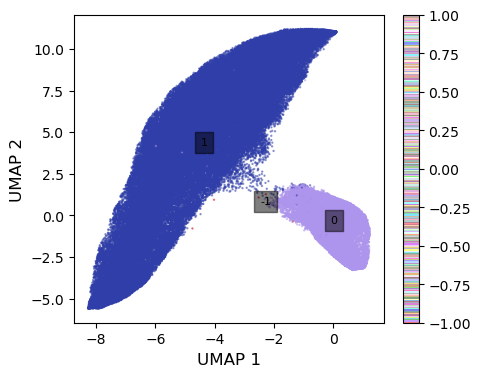

In [7]:
fig, ax = plt.subplots(figsize=(5, 4))

sc = ax.scatter(
    features_n2[:, 0],
    features_n2[:, 1],
    s=0.5,
    c=labels_n,
    alpha=0.5, cmap=cc.cm.glasbey)

for label_idx in unique_labels:
    x_centroid = np.mean(features_n2[labels_n == label_idx, 0])
    y_centroid = np.mean(features_n2[labels_n == label_idx, 1])
    ax.text(x_centroid, y_centroid, str(label_idx), bbox=dict(facecolor='black', alpha=0.5), fontsize=8)

plt.colorbar(sc)
ax.set_xlabel(f'{embedding_type} 1')
ax.set_ylabel(f'{embedding_type} 2')

## UMAP-PCA analysis of the main clusters

We perform n-dim UMAP to obtain a parameterization of the manifold of synapses. We subset to each cluster. Within each cluser, we perform PCA over n-dim UMAP to obtain (approximate) ellipsoidal parametrization of the UMAP.


### Parametrize the manifold

In [21]:
# cluster cluster; options: 'ex', 'in'
cluster_label = 'ex'

# choose the number of points to sample along each UMAP-PC
num_pca_trajectory_points_per_dimension = 19

# fit a UMAP over the selected subset
umap_n_dim = 2
n_neighbors = 1000
n_epochs = 5000
learning_rate = 0.1
spread = 1.0
min_dist = 0.1
random_state = 42

cluster_map = {
    'ex': [1],
    'in': [0],
}

n_synapses = len(features_nf)
cluster_index_mask = np.zeros((n_synapses,), dtype=np.bool8)
for leiden_label in cluster_map[cluster_label]:
    cluster_index_mask = cluster_index_mask | (labels_n == leiden_label)
    
subset_features_nf = features_nf[cluster_index_mask]
subset_index_to_global_index_map = np.nonzero(cluster_index_mask)[0]

# fit UMAP to subset
subset_umap_nd_fit = UMAP(
    min_dist=min_dist,
    spread=spread,
    n_neighbors=n_neighbors,
    learning_rate=learning_rate,
    n_epochs=n_epochs,
    random_state=random_state,
    n_components=umap_n_dim).fit(subset_features_nf)

subset_umap_features_nf = subset_umap_nd_fit.embedding_

# fit an "ellipsoid" to the UMAP parametrization of the subset
pca = PCA(n_components=umap_n_dim)
subset_umap_pca_fit = pca.fit(subset_umap_features_nf)
subset_umap_pca_features_nf = subset_umap_pca_fit.transform(subset_umap_features_nf)

# build a kNN graph of the UMAP PCA
from cuml.neighbors import NearestNeighbors
umap_pca_knn_fit = NearestNeighbors(n_neighbors=1).fit(subset_umap_features_nf)

# sweep UMAP-PCA space
features_centroid_f = np.mean(subset_umap_features_nf, axis=0)
z_pca_i_list = []
z_color_i_list = []
for pca_comp_index in range(umap_n_dim):
    pca_move_range = 1.5 * np.std(subset_umap_pca_features_nf[:, pca_comp_index])
    z_pca_i = np.linspace(-pca_move_range, pca_move_range, num=num_pca_trajectory_points_per_dimension)
    z_pca_i_list.append(z_pca_i)
    z_color_i = np.linspace(0, 1, num=num_pca_trajectory_points_per_dimension)
    z_color_i_list.append(z_color_i)

pca_grid_coords = np.concatenate(
    [mat[..., None] for mat in np.meshgrid(*z_pca_i_list)],
    axis=-1)

color_grid_coords = np.concatenate(
    [mat[..., None] for mat in np.meshgrid(*z_color_i_list)],
    axis=-1)

pca_grid_features = np.einsum('...k,kq->...q', pca_grid_coords, subset_umap_pca_fit.components_) + features_centroid_f
orig_shape = pca_grid_features.shape

# get nearest neighbor indices
_, indices = umap_pca_knn_fit.kneighbors(np.reshape(pca_grid_features, (-1, umap_n_dim)))
global_indices = subset_index_to_global_index_map[indices]

### Correlate UMAP-PCs with annotations

In [22]:
regression_keys = [
    'pre_synaptic_volume_log1p_zscore',
    'post_synaptic_volume_log1p_zscore',
    'cleft_size_log1p_zscore',
    'pre_cell_type',
    'post_cell_type',
    'has_mito_pre',
    'has_mito_post',
    'mito_size_pre_vx_log1p_zscore_zi',
    'mito_size_post_vx_log1p_zscore_zi',
    'presyn_soma_dist_log1p_zscore',
    'postsyn_soma_dist_log1p_zscore',
]

regression_labels = [
    'Pre-synaptic \n Process Size',
    'Post-synaptic \n Process Size',
    'Synaptic Cleft Size',
    'Pre-synaptic \n Inhibitory',
    'Post-synaptic \n Inhibitory',
    'Pre-synanaptic \n Mitochondria Presence',
    'Post-synanaptic \n Mitochondria Presence',
    'Pre-synanaptic \n Mitochondria Size',
    'Post-synanaptic \n Mitochondria Size',
    'Pre-synaptic \n Soma Distance',
    'Post-synaptic \n Soma Distance',
]

regression_type = [
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman',
    'spearman'
]


condition_keys = [
    None,
    None,
    None,
    None,
    None,
    None,
    None,
    'has_mito_pre',
    'has_mito_post',
    None,
    None,
]

n_trials = 20

# which annotations to use?
annotations_to_use = 'imputed'
cell_type_strategy = 'consensus'

# keep track of scores for each trial
score_array = np.zeros((n_trials, umap_n_dim, len(regression_keys)))

for i_trial in range(n_trials):

    if annotations_to_use == 'manual':
        analysis_meta_ext_df = meta_ext_df

    elif annotations_to_use == 'imputed':
        analysis_meta_ext_df = load_imputed_annotations_stochastic(
        meta_df,
        imputed_cell_types_df_path,
        imputed_meta_ext_df_path)

    else:
        raise ValueError

    # synapse IDs that lie at the intersection of (1) having annotation, (2) having being selected
    subset_synapse_ids = meta_df[cluster_index_mask]['synapse_id'].values
    meta_ext_df_synapse_ids = analysis_meta_ext_df['synapse_id'].values
    mutual_synapse_ids = list(set(subset_synapse_ids).intersection(meta_ext_df_synapse_ids))

    # select UMAP-PCA features and annotations for regression
    mutual_umap_pca_features_nf = subset_umap_pca_features_nf[
        list(map({synapse_id: i for i, synapse_id in enumerate(subset_synapse_ids)}.get, mutual_synapse_ids))]
    mutual_meta_ext_df = analysis_meta_ext_df.set_index('synapse_id').loc[mutual_synapse_ids].copy()
    
    # score
    for pca_comp_index in range(umap_n_dim):
        for i_key, (key, rtype, condition) in enumerate(zip(regression_keys, regression_type, condition_keys)):

            covariate_n = mutual_umap_pca_features_nf[:, pca_comp_index]
            response_n = mutual_meta_ext_df[key].values

            if condition is not None:
                condition_values = mutual_meta_ext_df[condition].values
                covariate_n = covariate_n[condition_values > 0]
                response_n = response_n[condition_values > 0]

            if rtype == 'spearman':
                score = stats.spearmanr(covariate_n, response_n).correlation
                score_array[i_trial, pca_comp_index, i_key] = score

            elif rtype == 'linear':
                reg = LinearRegression().fit(covariate_n[:, None], response_n[:, None])
                pred_response_n = reg.predict(covariate_n[:, None])
                ev = metrics.r2_score(response_n, pred_response_n)
                score_array[i_trial, pca_comp_index, i_key] = ev

            elif rtype == 'logistic':
                logreg = LogisticRegression().fit(covariate_n[:, None], response_n)
                auc = 2 * metrics.roc_auc_score(response_n, logreg.decision_function(covariate_n[:, None])) - 1
                score_array[i_trial, pca_comp_index, i_key] = auc
                
score_array_median = np.median(score_array, axis=0)
score_array_yerr = np.zeros((2,) + score_array.shape[1:])

for pca_comp_index in range(umap_n_dim):
    for i_key in range(len(regression_keys)):
        values = sorted(score_array[:, pca_comp_index, i_key])
        n_values = len(values)
        value_lo = values[int(n_values * 0.05)]
        value_hi = values[int(n_values * 0.95)]
        score_array_yerr[0, pca_comp_index, i_key] = score_array_median[pca_comp_index, i_key] - value_lo
        score_array_yerr[1, pca_comp_index, i_key] = value_hi - score_array_median[pca_comp_index, i_key]
            
# determine a good sense for each direction
sense = 2 * (np.sum(score_array_median, - 1) > 0) - 1

### Visualization helper methods

In [23]:
colormaps = [
    plt.cm.Reds,
    plt.cm.Blues,
    plt.cm.Greens,
    plt.cm.Purples,
    plt.cm.Oranges
]


def add_score_barplot_to_ax(
    ax, sense, scores, yerr, labels, color,
    capsize=10,
    show_labels=False,
    title=None,
    legend=None,
    legend_fontsize=12):

    scores = scores.copy()
    yerr = yerr.copy()
    
    if sense < 0:
        scores = (-1) * scores
        yerr = yerr[::-1, :]
    
    n = len(labels)
    ax.bar(
        np.arange(n),
        scores,
        color=color,
        yerr=yerr,
        align='center',
        ecolor='black',
        capsize=capsize,
        label=legend)
    
    ax.set_xticks(np.arange(n))
    if show_labels:
        ax.set_xticklabels(labels, rotation=90)
    else:
        ax.set_xticklabels([] * n, rotation=90)
        
    # Hide the right and top spines
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    # Only show ticks on the left and bottom spines
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')

    ax.set_ylim((-1, 1))
    ax.plot((-0.5, n - 0.5), (0, 0), '--', lw=1, color='gray')
    ax.set_ylabel('Spearman Correlation')
    
    if title is not None:
        ax.set_title(title, fontsize=14)

    if legend is not None:
        ax.legend(fontsize=legend_fontsize)

    
def add_colored_umap_to_ax(
        ax,
        highlighted_synapse_ids=[]):

    # color over the PCA grid
    colors_list = []
    for pca_comp_index in range(umap_n_dim):
        cmap = colormaps[pca_comp_index]
        grid_values = color_grid_coords[..., pca_comp_index]
        if sense[pca_comp_index] < 0:
            grid_values = 1. - grid_values
        colors = cmap(grid_values)
        colors_list.append(colors[None, ...])
    colors = np.reshape(np.mean(np.concatenate(colors_list), axis=0), (-1, 4))

    x = np.median(features_n2[global_indices, 0], -1)
    y = np.median(features_n2[global_indices, 1], -1)
    xy = np.stack((x, y)).T
    
    reg = LinearRegression()
    color_fit = reg.fit(xy, colors)
    color_pred = np.clip(color_fit.predict(features_n2[cluster_index_mask, :]), a_min=0., a_max=1.)

    sc = ax.scatter(
        features_n2[~cluster_index_mask, 0],
        features_n2[~cluster_index_mask, 1],
        s=1,
        alpha=0.025,
        color='gray',
        rasterized=True)

    sc = ax.scatter(
        features_n2[cluster_index_mask, 0],
        features_n2[cluster_index_mask, 1],
        s=1,
        alpha=1,
        c=color_pred,
        rasterized=True)

    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')

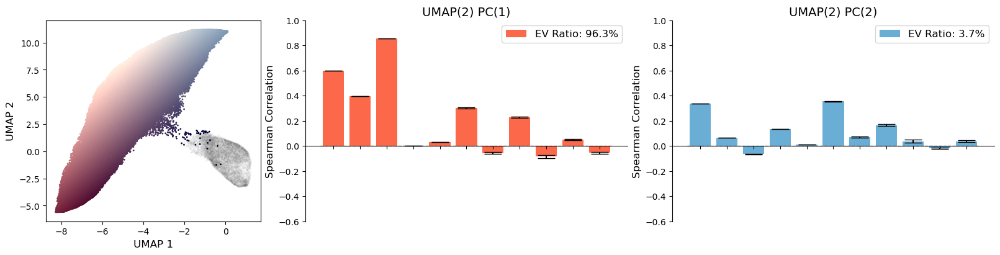

In [24]:
umap_width = 2
bar_width = 3
fig_height = 2
fig_width = umap_width + bar_width * umap_n_dim
fig_scale = 2

fig = plt.figure(constrained_layout=True, figsize=(fig_scale * fig_width, fig_scale * fig_height))
gs = fig.add_gridspec(fig_height, fig_width)

umap_ax = fig.add_subplot(gs[:, 0:umap_width])

add_colored_umap_to_ax(umap_ax)

for i in range(umap_n_dim):
    start = umap_width + i * bar_width
    end = umap_width + (i + 1) * bar_width
    bar_ax = fig.add_subplot(gs[:, start:end])
    add_score_barplot_to_ax(
        bar_ax,
        sense[i],
        score_array_median[i],
        score_array_yerr[:, i, :],
        regression_labels,
        colormaps[i](0.5),
        show_labels=False,
        title=f'UMAP({umap_n_dim}) PC({i + 1})',
        legend=f'EV Ratio: {subset_umap_pca_fit.explained_variance_ratio_[i] * 100:.1f}%',
        legend_fontsize=12
    )
    
    bar_ax.set_ylim((-0.6, 1))
    bar_ax.spines['bottom'].set_position('zero')
    
plt.savefig(
    os.path.join(output_path, f'umap_interpretation__{cluster_label}__horizontal__dim_{umap_n_dim}__spread_{spread:.2f}__min_dist_{min_dist:.2f}__seed_{random_state}.pdf'),
    dpi=300, bbox_inches='tight')

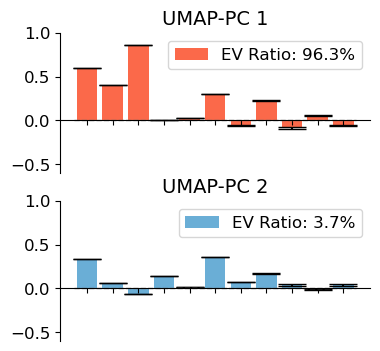

In [25]:
fig, axs = plt.subplots(nrows=umap_n_dim, figsize=(4, 2 * umap_n_dim))

for i in range(umap_n_dim):
    start = umap_width + i * bar_width
    end = umap_width + (i + 1) * bar_width
    bar_ax = axs[i]
    add_score_barplot_to_ax(
        bar_ax,
        sense[i],
        score_array_median[i],
        score_array_yerr[:, i, :],
        regression_labels,
        colormaps[i](0.5),
        show_labels=False,
        title=f'UMAP-PC {i + 1}',
        legend=f'EV Ratio: {subset_umap_pca_fit.explained_variance_ratio_[i] * 100:.1f}%',
        legend_fontsize=12,
        capsize=10
    )
    
    bar_ax.set_ylabel('')
    bar_ax.tick_params(axis='y', labelsize=12)
    
    bar_ax.set_ylim((-0.6, 1))
    bar_ax.spines['bottom'].set_position('zero')
    
plt.savefig(
    os.path.join(output_path, f'umap_interpretation__{cluster_label}__stacked_spearman__dim_{umap_n_dim}__spread_{spread:.2f}__min_dist_{min_dist:.2f}__seed_{random_state}.pdf'),
    dpi=300, bbox_inches='tight')

### Save indices of synapses along UMAP-PC sweeps for visualization

In [26]:
# only 1 kNN hit per PCA grid point
assert global_indices.shape[-1] == 1

synapse_index_flat = global_indices[..., 0]
synapse_index_grid = synapse_index_flat.reshape(orig_shape[:umap_n_dim])

synapse_id_flat = meta_df.iloc[synapse_index_flat]['synapse_id'].values
synapse_id_grid = synapse_id_flat.reshape(orig_shape[:umap_n_dim])

# save indices to disk
sweep_indices_path = os.path.join(output_path, 'indices')
os.makedirs(sweep_indices_path, exist_ok=True)

np.save(
    os.path.join(sweep_indices_path, f'umap_sweep__{cluster_label}__{num_pca_trajectory_points_per_dimension}__synapse_id_grid.npy'),
    synapse_id_grid)
np.save(
    os.path.join(sweep_indices_path, f'umap_sweep__{cluster_label}__{num_pca_trajectory_points_per_dimension}__synapse_index_grid.npy'),
    synapse_index_grid)

### Extract 3D renders of synapses over UMAP-PC sweeps

In [27]:
num_pca_trajectory_points_per_dimension = 19

sweep_images_path = os.path.join(output_path, 'umap_sweep')
os.makedirs(sweep_images_path, exist_ok=True)

output_path_view_1 = os.path.join(sweep_images_path, cluster_label, 'view_1')
os.makedirs(output_path_view_1, exist_ok=True)

output_path_view_2 = os.path.join(sweep_images_path, cluster_label, 'view_2')
os.makedirs(output_path_view_2, exist_ok=True)

synapse_id_grid = np.load(
    os.path.join(sweep_indices_path, f'umap_sweep__{cluster_label}__{num_pca_trajectory_points_per_dimension}__synapse_id_grid.npy'))
synapse_index_grid = np.load(
    os.path.join(sweep_indices_path, f'umap_sweep__{cluster_label}__{num_pca_trajectory_points_per_dimension}__synapse_index_grid.npy'))

ctx = vis.SynapseVisContext(
    dataset_path,
    '../../configs/config__ext/augmenter_display.yaml',
    meta_df_override=meta_df,
    device='cuda')

In [32]:
for i in range(synapse_index_grid.shape[0]):
    for j in range(synapse_index_grid.shape[1]):
        print(f'{i}, {j} ...')
        synapse_index = synapse_index_grid[i, j]
        synapse_id = ctx.synapse_dataset.meta_df.iloc[synapse_index].synapse_id
        output_filename_1 = os.path.join(output_path_view_1, f'umap_sweep__{cluster_label}__{i}__{j}__{synapse_id}__view_1.png')
        output_filename_2 = os.path.join(output_path_view_2, f'umap_sweep__{cluster_label}__{i}__{j}__{synapse_id}__view_2.png')
        if os.path.exists(output_filename_1) and os.path.exists(output_filename_2):
            continue
        fig = vis.make_3d_synapse_figure(ctx, synapse_index, surface_point_cloud_opacity=0.06);
        fig.write_image(output_filename_1)
        fig = vis.make_3d_synapse_figure(ctx, synapse_index, fig=fig, view_plane=2, surface_point_cloud_opacity=0.06);
        fig.write_image(output_filename_2)

0, 0 ...
0, 1 ...
0, 2 ...
0, 3 ...
0, 4 ...
0, 5 ...
0, 6 ...
0, 7 ...
0, 8 ...
0, 9 ...
0, 10 ...
0, 11 ...
0, 12 ...
0, 13 ...
0, 14 ...
0, 15 ...
0, 16 ...
0, 17 ...
0, 18 ...
1, 0 ...
1, 1 ...
1, 2 ...
1, 3 ...
1, 4 ...
1, 5 ...
1, 6 ...
1, 7 ...
1, 8 ...
1, 9 ...
1, 10 ...
1, 11 ...
1, 12 ...
1, 13 ...
1, 14 ...
1, 15 ...
1, 16 ...
1, 17 ...
1, 18 ...
2, 0 ...
2, 1 ...
2, 2 ...
2, 3 ...
2, 4 ...
2, 5 ...
2, 6 ...
2, 7 ...
2, 8 ...
2, 9 ...
2, 10 ...
2, 11 ...
2, 12 ...
2, 13 ...
2, 14 ...
2, 15 ...
2, 16 ...
2, 17 ...
2, 18 ...
3, 0 ...
3, 1 ...
3, 2 ...
3, 3 ...
3, 4 ...
3, 5 ...
3, 6 ...
3, 7 ...
3, 8 ...
3, 9 ...
3, 10 ...
3, 11 ...
3, 12 ...
3, 13 ...
3, 14 ...
3, 15 ...
3, 16 ...
3, 17 ...
3, 18 ...
4, 0 ...
4, 1 ...
4, 2 ...
4, 3 ...
4, 4 ...
4, 5 ...
4, 6 ...
4, 7 ...
4, 8 ...
4, 9 ...
4, 10 ...
4, 11 ...
4, 12 ...
4, 13 ...
4, 14 ...
4, 15 ...
4, 16 ...
4, 17 ...
4, 18 ...
5, 0 ...
5, 1 ...
5, 2 ...
5, 3 ...
5, 4 ...
5, 5 ...
5, 6 ...
5, 7 ...
5, 8 ...
5, 9 ...
5, 10 ...


## Generate tile plot

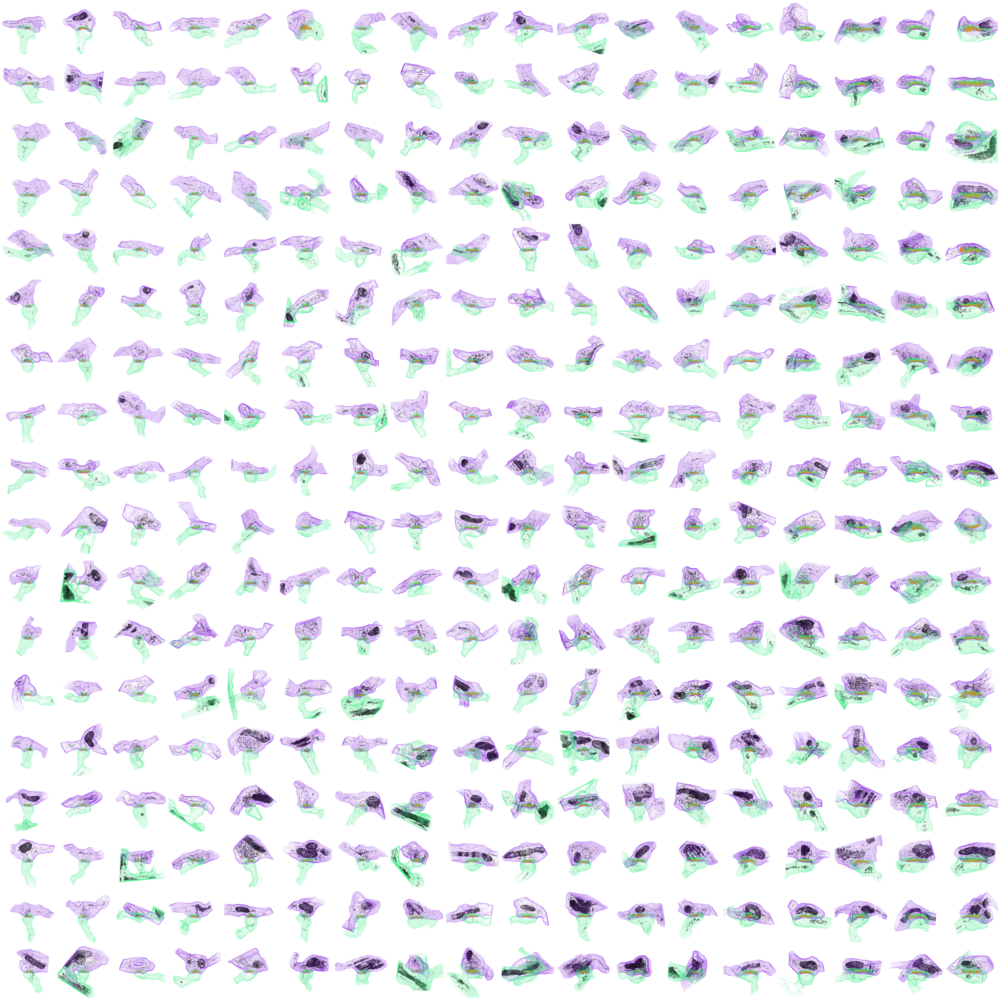

In [36]:
import matplotlib.image as img

margin_cut = 0
view = 2
resolution = 'high'

if resolution == 'high':
    figsize = 45
else:
    figsize = 12

# for excitatory cluster
if cluster_label == 'ex':
    
    if resolution == 'low':
        i_range = [6, 12, 15, 18]
        j_range = [15, 9, 6, 3]

    elif resolution == 'high':
        i_range = np.arange(18)
        j_range = np.arange(18)[::-1]

elif cluster_label == 'in':

    if resolution == 'low':
        i_range = [0, 4, 13, 18]
        j_range = [1, 6, 13, 18]
        
    elif resolution == 'high':
        i_range = np.arange(18)
        j_range = np.arange(18)
    

fig, axs = plt.subplots(ncols=len(j_range), nrows=len(i_range), figsize=(figsize, figsize))
for ax in axs.flatten():
    ax.axis('off')

sweep_images_path = os.path.join(output_path, 'umap_sweep')
synapse_png_root_path = os.path.join(sweep_images_path, cluster_label, f'view_{view}')

synapse_id_lookup = dict()
for _, _, filenames in os.walk(synapse_png_root_path):
    for filename in filenames:
        tokens = filename.split('__')
        if len(tokens) != 6:
            continue
        if tokens[-1] != f'view_{view}.png':
            continue
        try:
            row_i = int(tokens[2])
            col_j = int(tokens[3])
            synapse_id = int(tokens[4])
            synapse_id_lookup[(row_i, col_j)] = synapse_id
        except:
            pass

tile_synapse_ids = []
for ax_i, i in enumerate(i_range):
    for ax_j, j in enumerate(j_range):
        synapse_id = synapse_id_lookup[(i, j)]
        synapse_png_path = os.path.join(synapse_png_root_path, f'umap_sweep__{cluster_label}__{i}__{j}__{synapse_id}__view_{view}.png')
        image = img.imread(synapse_png_path)
        axs[ax_i, ax_j].imshow(image[
            margin_cut:image.shape[0] - margin_cut,
            margin_cut:image.shape[1] - margin_cut])
        tile_synapse_ids.append(synapse_id)
        
fig.tight_layout()

fig.savefig(
    os.path.join(output_path, f'umap_sweep__{cluster_label}__tile__view_{view}__{resolution}.png'),
    transparent=False,
    facecolor='white')

In [39]:
def add_colored_umap_to_ax(
        ax,
        highlighted_synapse_ids=[],
        marker_size=15,
        lw=1):

    # color over the PCA grid
    colors_list = []
    for pca_comp_index in range(umap_n_dim):
        cmap = colormaps[pca_comp_index]
        grid_values = color_grid_coords[..., pca_comp_index]
        if sense[pca_comp_index] < 0:
            grid_values = 1. - grid_values
        colors = cmap(grid_values)
        colors_list.append(colors[None, ...])
    colors = np.reshape(np.mean(np.concatenate(colors_list), axis=0), (-1, 4))

    x = np.median(features_n2[global_indices, 0], -1)
    y = np.median(features_n2[global_indices, 1], -1)
    xy = np.stack((x, y)).T
    
    reg = LinearRegression()
    color_fit = reg.fit(xy, colors)
    color_pred = np.clip(color_fit.predict(features_n2[cluster_index_mask, :]), a_min=0., a_max=1.)

    sc = ax.scatter(
        features_n2[~cluster_index_mask, 0],
        features_n2[~cluster_index_mask, 1],
        s=1,
        alpha=0.025,
        color='gray',
        rasterized=True)

    sc = ax.scatter(
        features_n2[cluster_index_mask, 0],
        features_n2[cluster_index_mask, 1],
        s=1,
        alpha=1,
        c=color_pred,
        rasterized=True)
    
    _map = {synapse_id: idx for idx, synapse_id in enumerate(meta_df['synapse_id'].values)}
    highlighted_synapse_indices = list(map(_map.get, highlighted_synapse_ids))
    highlighted_synapse_indices = [idx for idx in highlighted_synapse_indices if cluster_index_mask[idx]]
    
    sc = ax.scatter(
        features_n2[highlighted_synapse_indices, 0],
        features_n2[highlighted_synapse_indices, 1],
        lw=lw,
        s=marker_size,
        facecolor='white',
        edgecolor='black')
        
    ax.set_xlabel('UMAP 1')
    ax.set_ylabel('UMAP 2')

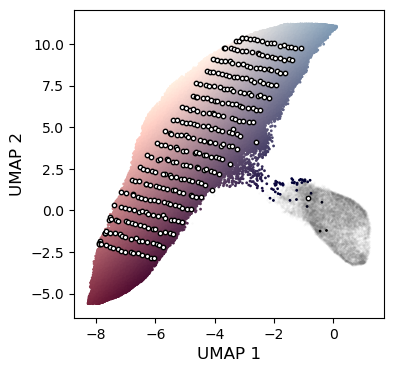

In [40]:
fig, ax = plt.subplots(figsize=(4, 4))

if cluster_label == 'in':
    marker_size = 5
    lw = 0.5
else:
    marker_size = 10
    lw = 1.0
    
add_colored_umap_to_ax(ax, tile_synapse_ids, marker_size=marker_size, lw=lw)
plt.savefig(os.path.join(output_path, f'umap_interpretation__{cluster_label}__selected_examples__{resolution}.pdf'), bbox_inches='tight')

## Cluster global statistics

In [41]:
# load annotation transformation for inverse transformation to original units
loc_and_scale_df = pd.read_csv(
    os.path.join('../../tables/meta_ext_loc_scale.csv'), index_col=None)

# add missing
loc_and_scale_df['pre_synaptic_volume_log1p_zscore__loc'] = np.mean(np.log1p(meta_df['pre_synaptic_volume'].values))
loc_and_scale_df['pre_synaptic_volume_log1p_zscore__scale'] = np.std(np.log1p(meta_df['pre_synaptic_volume'].values))
loc_and_scale_df['post_synaptic_volume_log1p_zscore__loc'] = np.mean(np.log1p(meta_df['post_synaptic_volume'].values))
loc_and_scale_df['post_synaptic_volume_log1p_zscore__scale'] = np.std(np.log1p(meta_df['post_synaptic_volume'].values))

In [42]:
cluster_map = {
    'ex': [1],
    'in': [0],
}

n_synapses = len(features_nf)

In [43]:
global_continuous_trait_list = [
    'pre_synaptic_volume_log1p_zscore',
    'post_synaptic_volume_log1p_zscore',
    'cleft_size_log1p_zscore',
    'mito_size_pre_vx_log1p_zscore_zi',
    'mito_size_post_vx_log1p_zscore_zi',
    'presyn_soma_dist_log1p_zscore',
    'postsyn_soma_dist_log1p_zscore',
]

global_continuous_trait_conditional_list = [
    None,
    None,
    None,
    'has_mito_pre',
    'has_mito_post',
    None,
    None
]

global_continuous_trait_label_list = [
    'Pre-synaptic Volume (vx)',
    'Post-synaptic Volume (vx)',
    'Cleft Size (vx)',
    'Pre-synaptic Mitochondria Size (vx)',
    'Post-synaptic Mitochondria Size (vx)',
    'Pre-synaptic Soma Distance (um)',
    'Post-synaptic Soma Distance Size (um)'
]

trait_scale_list = [
    64e-8,
    64e-8,
    64e-8,
    64e-8,
    64e-8,
    1.,
    1.,
]

In [44]:
# which annotations to use?
annotations_to_use = 'imputed'
cell_type_strategy = 'consensus'

if annotations_to_use == 'manual':
    analysis_meta_ext_df = meta_ext_df.copy()
    analysis_meta_ext_df['pre_synaptic_volume_log1p_zscore'] = log1p_zscore(meta_ext_df['pre_synaptic_volume'].values)
    analysis_meta_ext_df['post_synaptic_volume_log1p_zscore'] = log1p_zscore(meta_ext_df['post_synaptic_volume'].values)
    
elif annotations_to_use == 'imputed':
    analysis_meta_ext_df = load_imputed_annotations_stochastic(
    meta_df,
    imputed_cell_types_df_path,
    imputed_meta_ext_df_path)

else:
    raise ValueError

analysis_meta_ext_df = analysis_meta_ext_df.set_index('synapse_id')
    
n_synapses = len(meta_df)
ex_global_statistics_dict = dict()
in_global_statistics_dict = dict()

for cluster_label, cluster_global_statistics_dict in zip(
        ['ex', 'in'],
        [ex_global_statistics_dict, in_global_statistics_dict]):    
    
    cluster_index_mask = np.zeros((n_synapses,), dtype=np.bool8)
    for leiden_label in cluster_map[cluster_label]:
        cluster_index_mask = cluster_index_mask | (labels_n == leiden_label)
    subset_synapse_ids = meta_df[cluster_index_mask]['synapse_id'].values    
    cluster_meta_ext_df = analysis_meta_ext_df[analysis_meta_ext_df.index.isin(subset_synapse_ids)]

    for trait_key, trait_conditional, trait_label, trait_scale in zip(
            global_continuous_trait_list,
            global_continuous_trait_conditional_list,
            global_continuous_trait_label_list,
            trait_scale_list):

        loc = loc_and_scale_df[trait_key + '__loc'].item()
        scale = loc_and_scale_df[trait_key + '__scale'].item()

        log1p_zscore_values = cluster_meta_ext_df[trait_key].values        
        values = trait_scale * (np.exp(log1p_zscore_values * scale + loc) - 1.)

        if trait_conditional is not None:
            control_mask = cluster_meta_ext_df[trait_conditional].values > 0
            values = values[control_mask]

        cluster_global_statistics_dict[trait_label] = values

In [45]:
ex_global_statistics_dict

{'Pre-synaptic Volume (vx)': array([0.240448 , 0.7861536, 0.142976 , ..., 0.207568 , 0.166256 ,
        0.430016 ]),
 'Post-synaptic Volume (vx)': array([0.2274496, 0.4849312, 0.0514624, ..., 0.1494944, 0.4978944,
        0.1075808]),
 'Cleft Size (vx)': array([7.59997524e-05, 1.25160206e-03, 8.01610025e-05, ...,
        1.08677047e-04, 1.11759764e-04, 8.13172426e-05]),
 'Pre-synaptic Mitochondria Size (vx)': array([0.03688705, 0.04214082, 0.03367394, ..., 0.02250927, 0.02286341,
        0.06191579]),
 'Post-synaptic Mitochondria Size (vx)': array([0.96504588, 1.00255314, 3.44004616, ..., 0.66308804, 0.23842516,
        0.26146208]),
 'Pre-synaptic Soma Distance (um)': array([210.18359104, 161.32443459, 139.28178259, ..., 165.86152425,
        188.23612271, 211.01747279]),
 'Post-synaptic Soma Distance Size (um)': array([ 69.25089076,  61.74356774,  89.71096861, ..., 186.0554476 ,
         99.75998259, 109.77062302])}

In [46]:
in_global_statistics_dict

{'Pre-synaptic Volume (vx)': array([0.8849344, 0.6262624, 0.836224 , ..., 0.5921792, 0.2175392,
        0.3669056]),
 'Post-synaptic Volume (vx)': array([1.8275264, 1.25152  , 4.8524608, ..., 1.12496  , 0.9340576,
        1.1502208]),
 'Cleft Size (vx)': array([1.82017687e-04, 1.14301200e-04, 5.98010052e-04, ...,
        1.88642051e-04, 5.96957915e-05, 4.12854318e-05]),
 'Pre-synaptic Mitochondria Size (vx)': array([0.07488177, 0.03325   , 0.09395594, ..., 0.11030977, 0.0681273 ,
        0.02657302]),
 'Post-synaptic Mitochondria Size (vx)': array([0.114179  , 0.16730206, 0.65309702, ..., 0.20595106, 0.25405398,
        1.16938287]),
 'Pre-synaptic Soma Distance (um)': array([169.02240853, 179.6661171 , 117.05016928, ..., 209.26272289,
        178.52833571, 189.34846694]),
 'Post-synaptic Soma Distance Size (um)': array([ 43.30383416,  13.90679145,   7.62136607, ...,  36.70115768,
        116.4709808 ,  22.55525455])}

In [47]:
ex_binary_statistics_dict = dict()
in_binary_statistics_dict = dict()

for cluster_label, cluster_global_statistics_dict in zip(
        ['ex', 'in'],
        [ex_binary_statistics_dict, in_binary_statistics_dict]):

    cluster_index_mask = np.zeros((n_synapses,), dtype=np.bool8)
    for leiden_label in cluster_map[cluster_label]:
        cluster_index_mask = cluster_index_mask | (labels_n == leiden_label)
    subset_synapse_ids = meta_df[cluster_index_mask]['synapse_id'].values    
    cluster_meta_ext_df = analysis_meta_ext_df[analysis_meta_ext_df.index.isin(subset_synapse_ids)]

    n_total = len(cluster_meta_ext_df)
    
    print(f'{cluster_label}: {n_total}')
    
    cluster_global_statistics_dict['Ex to Ex'] = 100. * np.sum((cluster_meta_ext_df['pre_cell_type'] == 0) & (cluster_meta_ext_df['post_cell_type'] == 0)) / n_total
    cluster_global_statistics_dict['Ex to In'] = 100. * np.sum((cluster_meta_ext_df['pre_cell_type'] == 0) & (cluster_meta_ext_df['post_cell_type'] == 1)) / n_total
    cluster_global_statistics_dict['In to Ex'] = 100. * np.sum((cluster_meta_ext_df['pre_cell_type'] == 1) & (cluster_meta_ext_df['post_cell_type'] == 0)) / n_total
    cluster_global_statistics_dict['In to In'] = 100. * np.sum((cluster_meta_ext_df['pre_cell_type'] == 1) & (cluster_meta_ext_df['post_cell_type'] == 1)) / n_total
    cluster_global_statistics_dict['Pre-synaptic Mitochondria Presence'] = 100. * np.sum(cluster_meta_ext_df['has_mito_pre'] == 1) / n_total
    cluster_global_statistics_dict['Post-synaptic Mitochondria Presence'] = 100. * np.sum(cluster_meta_ext_df['has_mito_post'] == 1) / n_total

ex: 79214
in: 15652


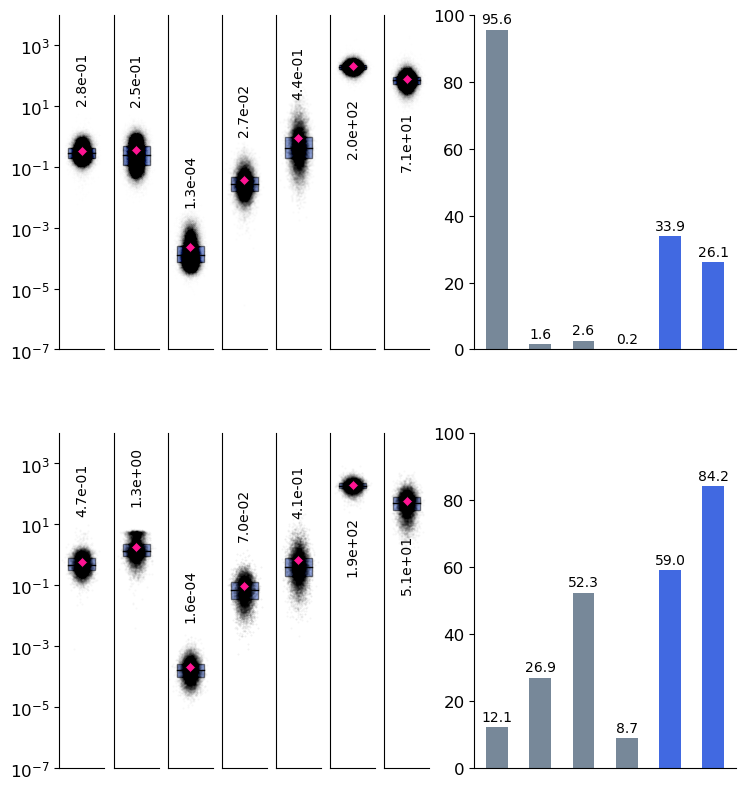

In [48]:
from matplotlib import gridspec

n_columns = len(in_global_statistics_dict)
n_extra = len(in_binary_statistics_dict)

bar_width = 5
tick_fontsize = 12

fig = plt.figure(figsize=(0.6 * (n_columns + bar_width), 8))
gs = gridspec.GridSpec(2, n_columns + bar_width)

axs = dict()
for i_column in range(n_columns):    
    ax1 = fig.add_subplot(gs[0, i_column])
    ax2 = fig.add_subplot(gs[1, i_column], sharey=ax1)
    axs[(0, i_column)] = ax1
    axs[(1, i_column)] = ax2

    for ax in [ax1, ax2]:
        ax.set_xticks([])
        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.yaxis.set_ticks_position('left')
        ax.xaxis.set_ticks_position('bottom')
        ax.tick_params(axis='y', labelsize=tick_fontsize)

ax_bar_ex = fig.add_subplot(gs[0, n_columns:])
ax_bar_in = fig.add_subplot(gs[1, n_columns:])


for i_column, (column_name, ymax, yticks, h) in enumerate(zip(
        ex_global_statistics_dict.keys(),
        [2e8, 8e8, 1e5, 3e7, 3e8, 5e2, 2e2],
        [2, 1, 1, 5, 3, 5, 2],
        [300, 300, 300, 300, 300, 0.01, 0.01])):
    
    ex_data = ex_global_statistics_dict[column_name]
    in_data = in_global_statistics_dict[column_name]
    
    ax_ex = axs[(0, i_column)]
    ax_in = axs[(1, i_column)]
    
    for ax, data in zip([ax_ex, ax_in], [ex_data, in_data]):
        
        bp = ax.boxplot(data, showfliers=False, whis=0., widths=0.6, showmeans=True, patch_artist=True)    
        # ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
 
        for patch in bp['boxes']:
            patch.set_facecolor('royalblue')
            patch.set_alpha(0.5)
            
        for median in bp['medians']:
            median.set(color='black', linewidth=1)
            median_value = median.get_ydata()[0]
            ax.text(1, median_value * h,
                    '%.1e' % float(median_value),
                    ha='center', va='center', rotation=90)

        for mean in bp['means']:
            mean.set_markeredgecolor('black')
            mean.set_markerfacecolor('deeppink')
            mean.set_marker('D')
            mean.set_markersize(5)
            mean.set_markeredgewidth(0.5)

        x = np.random.normal(1, 0.1, size=len(data))
        ax.plot(x, data, '.', color='black', alpha=min(1., 500. / len(data)), markersize=1, rasterized=True)
        ax.set_yscale('log')
        ax.tick_params(axis='y', labelsize=12)
        ax.set_ylim((1e-7, 1e4))
        locmin = matplotlib.ticker.LogLocator(base=10.0, subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9), numticks=4)
        ax.yaxis.set_minor_locator(locmin)
        ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())

    ax_ex.set_xticks([])
    ax_in.set_xticks([])
    
    if i_column > 0:
        ax_ex.set_yticks([])
        ax_in.set_yticks([])
    

for ax, data_dict in zip([ax_bar_ex, ax_bar_in], [ex_binary_statistics_dict, in_binary_statistics_dict]):    

    ax.set_xticks([])
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.set_ylim((0, 100))
    ax.tick_params(axis='y', labelsize=tick_fontsize)
    
    rects = ax.bar(
        np.arange(n_extra),
        list(data_dict.values()),
        color=['lightslategray', 'lightslategray', 'lightslategray', 'lightslategray', 'royalblue', 'royalblue'],
        width=0.5)

    for i, rect in enumerate(rects):
        label = list(data_dict.values())[i]
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., height + 1.,
                '%.1f' % float(label),
                ha='center', va='bottom')

fig.tight_layout()
fig.subplots_adjust(wspace=0.2, hspace=0.25)

for ax in [ax_bar_ex, ax_bar_in]:
    pos1 = ax.get_position() # get the original position 
    pos2 = [pos1.x0 + 0.05, pos1.y0,  pos1.width, pos1.height] 
    ax.set_position(pos2)

plt.savefig(os.path.join(output_path, 'umap_interpretation__global_stats.pdf'), bbox_inches='tight')